In [6]:
import torch
print("ashish")
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

ashish
cuda


In [9]:
# Add pruning code directory to system path
import sys
sys.path.append('../FPGM_pruning')
import models

In [14]:
net = models.resnet110(10).to(device)

CifarResNet : Depth : 110 , Layers for each block : 18


In [15]:
print(net)

CifarResNet(
  (conv_1_3x3): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  (bn_1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (stage_1): Sequential(
    (0): ResNetBasicblock(
      (conv_a): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn_a): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv_b): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn_b): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): ResNetBasicblock(
      (conv_a): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn_a): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv_b): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn_b): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine

Files already downloaded and verified
Files already downloaded and verified


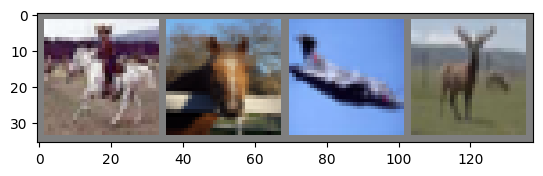

horse horse plane deer 


In [16]:
# Import necessary libraries
import torch
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import numpy as np

# Download and transform CIFAR-10 dataset
transform = transforms.Compose(
    [transforms.ToTensor(),
     transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])

trainset = torchvision.datasets.CIFAR10(root='../Data', train=True,
                                        download=True, transform=transform)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=4,
                                          shuffle=True, num_workers=2)

testset = torchvision.datasets.CIFAR10(root='../Data', train=False,
                                       download=True, transform=transform)
testloader = torch.utils.data.DataLoader(testset, batch_size=4,
                                         shuffle=False, num_workers=2)

classes = ('plane', 'car', 'bird', 'cat',
           'deer', 'dog', 'frog', 'horse', 'ship', 'truck')

# Function to show an image
def imshow(img):
    img = img / 2 + 0.5  # unnormalize
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.show()

# Get some random training images
dataiter = iter(trainloader)
images, labels = dataiter.next()

# Show images
imshow(torchvision.utils.make_grid(images))
# Print labels
print(' '.join(f'{classes[labels[j]]:5s}' for j in range(4)))


In [17]:
# Function to test the model
def test_model(net, testloader, return_accuracy=False):
    net.eval()
    correct = 0
    total = 0
    with torch.no_grad():
        for data in testloader:
            images, labels = data
            images, labels = images.to(device), labels.to(device)
            outputs = net(images)
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    accuracy = 100 * correct / total
    if return_accuracy:
        return accuracy
    print(f'Accuracy of the network on the 10000 test images: {accuracy:.2f}%')

In [5]:
!python  ../FPGM_pruning/pruning_resnet_cifar.py  ../Data/ --dataset cifar10 --arch resnet110 \
--save_path 'output_resnet110' \
--epochs 60 \
--learning_rate 0.01 --batch_size 256 \
--rate_norm 0.4 \
--dist_type l2 \
--use_state_dict \
--layer_begin 0  --layer_end 320 --layer_inter 3 --ngpu 3

save path : output_resnet110
{'arch': 'resnet110', 'arch_change': False, 'batch_size': 256, 'data_path': '../Data/', 'dataset': 'cifar10', 'decay': 0.0005, 'dist_type': 'l2', 'epoch_prune': 1, 'epochs': 60, 'evaluate': False, 'gammas': [0.1, 0.1, 0.1, 0.1, 0.1], 'layer_begin': 0, 'layer_end': 320, 'layer_inter': 3, 'learning_rate': 0.01, 'manualSeed': 5149, 'momentum': 0.9, 'ngpu': 3, 'pretrain_path': '', 'print_freq': 200, 'rate_dist': 0.6, 'rate_norm': 1, 'resume': '', 'save_path': 'output_resnet110', 'schedule': [50, 60, 120, 150, 225], 'start_epoch': 0, 'use_cuda': True, 'use_pretrain': False, 'use_state_dict': True, 'workers': 2}
Random Seed: 5149
python version : 3.8.3 (default, Jul  2 2020, 16:21:59)  [GCC 7.3.0]
torch  version : 1.7.1
cudnn  version : 8005
Norm Pruning Rate: 1
Distance Pruning Rate: 0.6
Layer Begin: 0
Layer End: 320
Layer Inter: 3
Epoch prune: 1
use pretrain: False
Pretrain path: 
Dist type: l2
Files already downloaded and verified
Files already downloaded and 

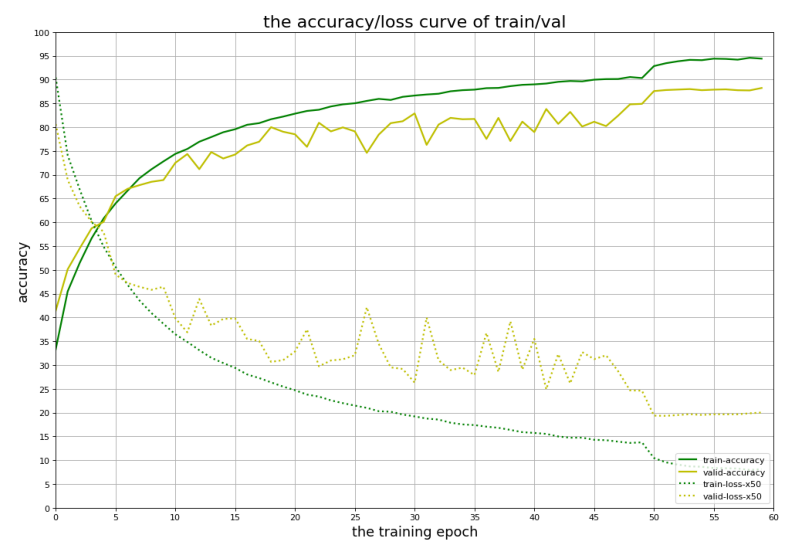

In [7]:
import matplotlib.pyplot as plt
from PIL import Image

def display_saved_plot(image_path):
    """
    Function to display a saved plot from a .png file.

    :: Inputs - image_path = path to the .png image file
    """
    # Open the image file
    img = Image.open(image_path)
    
    # Display the image
    plt.figure(figsize=(10, 10))
    plt.imshow(img)
    plt.axis('off')  # Turn off axis
    plt.show()

# Example usage
display_saved_plot("output_resnet110/curve.png")


In [17]:
!python  ../FPGM_pruning/pruning_resnet_cifar.py  ../Data/ --dataset cifar10 --arch resnet110 \
--save_path 'output_resnet110' \
--evaluate \
--resume output_resnet110/model_best.pth.tar \
--batch_size 256 \
--ngpu 3

save path : output_resnet110
{'arch': 'resnet110', 'arch_change': False, 'batch_size': 256, 'data_path': '../Data/', 'dataset': 'cifar10', 'decay': 0.0005, 'dist_type': 'l2', 'epoch_prune': 1, 'epochs': 300, 'evaluate': True, 'gammas': [0.1, 0.1, 0.1, 0.1, 0.1], 'layer_begin': 1, 'layer_end': 20, 'layer_inter': 3, 'learning_rate': 0.1, 'manualSeed': 5973, 'momentum': 0.9, 'ngpu': 3, 'pretrain_path': '', 'print_freq': 200, 'rate_dist': 0, 'rate_norm': 1, 'resume': 'output_resnet110/model_best.pth.tar', 'save_path': 'output_resnet110', 'schedule': [50, 60, 120, 150, 225], 'start_epoch': 0, 'use_cuda': True, 'use_pretrain': False, 'use_state_dict': False, 'workers': 2}
Random Seed: 5973
python version : 3.8.3 (default, Jul  2 2020, 16:21:59)  [GCC 7.3.0]
torch  version : 1.7.1
cudnn  version : 8005
Norm Pruning Rate: 1
Distance Pruning Rate: 0
Layer Begin: 1
Layer End: 20
Layer Inter: 3
Epoch prune: 1
use pretrain: False
Pretrain path: 
Dist type: l2
Files already downloaded and verified


In [2]:
!CUDA_VISIBLE_DEVICES=2 python  ../FPGM_pruning/pruning_resnet_cifar.py  ../Data/ --dataset cifar10 --arch resnet32 \
--output_dir 'output_resnet32_L2_0.9C' \
--epochs 160 \
--learning_rate 0.01 --batch_size 256 \
--rate_norm 0.1 \
--dist_type l2 \
--use_state_dict \
--layer_begin 0  --layer_end 320 --layer_inter 1 --ngpu 1

save path : output_resnet32_L2_0.9C
{'arch': 'resnet32', 'arch_change': False, 'batch_size': 256, 'data_path': '../Data/', 'dataset': 'cifar10', 'decay': 0.0005, 'dist_type': 'l2', 'epoch_prune': 1, 'epochs': 160, 'evaluate': False, 'gammas': [0.1, 0.1, 0.1, 0.1, 0.1], 'layer_begin': 0, 'layer_end': 320, 'layer_inter': 1, 'learning_rate': 0.01, 'manualSeed': 6118, 'momentum': 0.9, 'ngpu': 1, 'output_dir': 'output_resnet32_L2_0.9C', 'pretrain_path': '', 'print_freq': 200, 'rate_dist': 0, 'rate_norm': 0.1, 'resume': '', 'save_path': 'output_resnet32_L2_0.9C', 'schedule': [50, 60, 120, 150, 225], 'start_epoch': 0, 'use_cuda': True, 'use_pretrain': False, 'use_state_dict': True, 'workers': 2}
Random Seed: 6118
python version : 3.8.3 (default, Jul  2 2020, 16:21:59)  [GCC 7.3.0]
torch  version : 1.7.1
cudnn  version : 8005
Norm Pruning Rate: 0.1
Distance Pruning Rate: 0
Layer Begin: 0
Layer End: 320
Layer Inter: 1
Epoch prune: 1
use pretrain: False
Pretrain path: 
Dist type: l2
Files alread

In [3]:
!CUDA_VISIBLE_DEVICES=2 python  ../FPGM_pruning/pruning_resnet_cifar.py  ../Data/ --dataset cifar10 --arch resnet32 \
--output_dir 'output_resnet32_L2_0.6C' \
--epochs 160 \
--learning_rate 0.01 --batch_size 256 \
--rate_norm 0.4 \
--dist_type l2 \
--use_state_dict \
--layer_begin 0  --layer_end 320 --layer_inter 1 --ngpu 1

save path : output_resnet32_L2_0.6C
{'arch': 'resnet32', 'arch_change': False, 'batch_size': 256, 'data_path': '../Data/', 'dataset': 'cifar10', 'decay': 0.0005, 'dist_type': 'l2', 'epoch_prune': 1, 'epochs': 160, 'evaluate': False, 'gammas': [0.1, 0.1, 0.1, 0.1, 0.1], 'layer_begin': 0, 'layer_end': 320, 'layer_inter': 1, 'learning_rate': 0.01, 'manualSeed': 7347, 'momentum': 0.9, 'ngpu': 1, 'output_dir': 'output_resnet32_L2_0.6C', 'pretrain_path': '', 'print_freq': 200, 'rate_dist': 0, 'rate_norm': 0.4, 'resume': '', 'save_path': 'output_resnet32_L2_0.6C', 'schedule': [50, 60, 120, 150, 225], 'start_epoch': 0, 'use_cuda': True, 'use_pretrain': False, 'use_state_dict': True, 'workers': 2}
Random Seed: 7347
python version : 3.8.3 (default, Jul  2 2020, 16:21:59)  [GCC 7.3.0]
torch  version : 1.7.1
cudnn  version : 8005
Norm Pruning Rate: 0.4
Distance Pruning Rate: 0
Layer Begin: 0
Layer End: 320
Layer Inter: 1
Epoch prune: 1
use pretrain: False
Pretrain path: 
Dist type: l2
Files alread

In [4]:
!CUDA_VISIBLE_DEVICES=2 python ../FPGM_pruning/pruning_cifar_vgg.py  ../Data --dataset cifar10 --arch vgg \
--output_dir output_vgg_16_l2_0.6C \
--epochs 160 \
--rate_norm 0.4 \
--dist_type l2 \
--depth 16 \
--batch_size 256 

save path : output_vgg_16_l2_0.6C
{'arch': 'vgg', 'arch_change': False, 'batch_size': 256, 'cuda': True, 'data_path': '../Data', 'dataset': 'cifar10', 'depth': 16, 'dist_type': 'l2', 'epoch_prune': 1, 'epochs': 160, 'evaluate': False, 'layer_begin': 1, 'layer_end': 1, 'layer_inter': 1, 'log_interval': 100, 'lr': 0.1, 'momentum': 0.9, 'no_cuda': False, 'output_dir': 'output_vgg_16_l2_0.6C', 'pretrain_path': '', 'rate_dist': 0, 'rate_norm': 0.4, 'resume': '', 'save_path': 'output_vgg_16_l2_0.6C', 'seed': 1, 'start_epoch': 0, 'test_batch_size': 256, 'use_precfg': False, 'use_pretrain': False, 'use_state_dict': False, 'weight_decay': 0.0001}
Random Seed: 1
python version : 3.8.3 (default, Jul  2 2020, 16:21:59)  [GCC 7.3.0]
torch  version : 1.7.1
cudnn  version : 8005
Norm Pruning Rate: 0.4
Distance Pruning Rate: 0
Layer Begin: 1
Layer End: 1
Layer Inter: 1
Epoch prune: 1
use pretrain: False
Pretrain path: 
Dist type: l2
Pre cfg: False
Files already downloaded and verified
=> creating mode

In [5]:
!CUDA_VISIBLE_DEVICES=2 python ../FPGM_pruning/pruning_cifar_vgg.py  ../Data --dataset cifar10 --arch vgg \
--output_dir output_vgg_16_l2_0.9C \
--epochs 160 \
--rate_norm 0.1 \
--dist_type l2 \
--depth 16 \
--batch_size 256 

save path : output_vgg_16_l2_0.9C
{'arch': 'vgg', 'arch_change': False, 'batch_size': 256, 'cuda': True, 'data_path': '../Data', 'dataset': 'cifar10', 'depth': 16, 'dist_type': 'l2', 'epoch_prune': 1, 'epochs': 160, 'evaluate': False, 'layer_begin': 1, 'layer_end': 1, 'layer_inter': 1, 'log_interval': 100, 'lr': 0.1, 'momentum': 0.9, 'no_cuda': False, 'output_dir': 'output_vgg_16_l2_0.9C', 'pretrain_path': '', 'rate_dist': 0, 'rate_norm': 0.1, 'resume': '', 'save_path': 'output_vgg_16_l2_0.9C', 'seed': 1, 'start_epoch': 0, 'test_batch_size': 256, 'use_precfg': False, 'use_pretrain': False, 'use_state_dict': False, 'weight_decay': 0.0001}
Random Seed: 1
python version : 3.8.3 (default, Jul  2 2020, 16:21:59)  [GCC 7.3.0]
torch  version : 1.7.1
cudnn  version : 8005
Norm Pruning Rate: 0.1
Distance Pruning Rate: 0
Layer Begin: 1
Layer End: 1
Layer Inter: 1
Epoch prune: 1
use pretrain: False
Pretrain path: 
Dist type: l2
Pre cfg: False
Files already downloaded and verified
=> creating mode